# Sensitivity Test

Jieshu Wang

_Currencies_: $S_M$, $\frac{omega}{price}$, $U_{mean}$, $leisure\_time_{mean}$, 


In [1]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd

#### import functions from model files
from series_parameters_1 import series_params
from initialisation_functions_1 import *

from firm_functions_1 import *

from household_functions_1 import *
from market_functions_1 import *
from simulation_1 import *
from numpy.random import default_rng
from operator import itemgetter

import warnings
warnings.filterwarnings('ignore')

plt.rc('font',**{'family':'sans-serif','sans-serif':['Futura']})

currencies = ['S_M','ratio','mean_U','mean_leisure_time']


## S_N



In [2]:
params = {'fix_ai_cost_list':(10_000_000,), 'ai_omega_list':(9,), 'ai_tax_rate_list':(1,),'reps':100, 't_max':500, 'S_N_list':(0,100,200,400,800,1200,1600,2000,2400)}
srf, final_srf=run_simulation(**params)

This experiment consists of 900 simulations
consisting of 9 parameter sets.

Finished series.


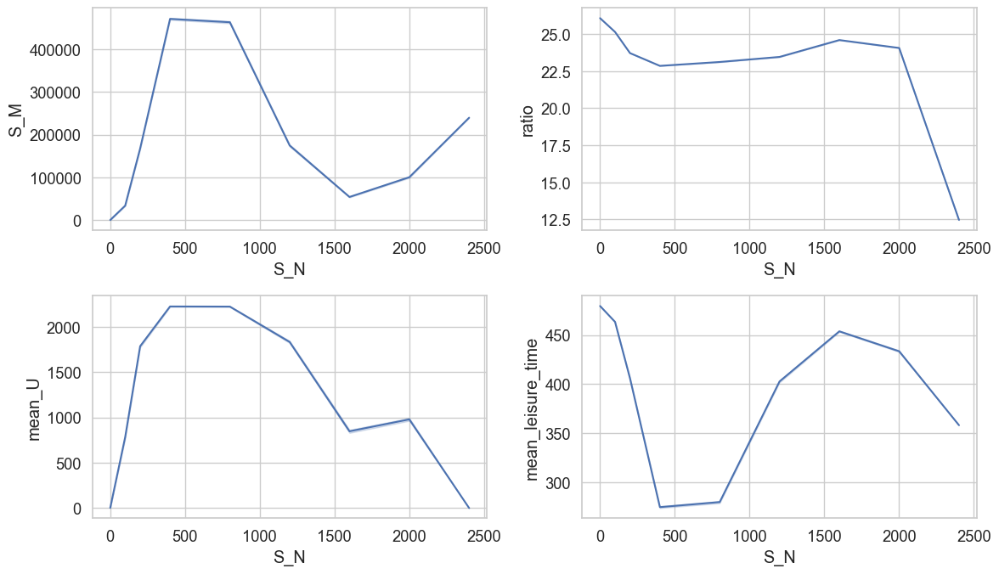

In [7]:

sns.set_theme(style='whitegrid', font_scale=1.2)

fig, axes=plt.subplots(nrows=2, ncols=2, figsize=(12,7), sharey=False, sharex=False,tight_layout=True)

for col, ax in zip(currencies, axes.flat):
    sns.lineplot(data=srf, x='S_N', y=col, ax=ax)

# sns.relplot(data=final_srf, x='S_N', y='mean_U', estimator='mean',kind='line')

## Fix AI cost

In [10]:
params = {'fix_ai_cost_list':(10_000, 30_000, 50_000,80_000, 100_000,200_000, 300_000, 400_000, 500_000, 600_000, 700_000, 800_000, 1_000_000), 'ai_omega_list':(2,), 'ai_tax_rate_list':(.5,),'reps':50, 't_max':300}
srf, final_srf=run_simulation(**params)

This experiment consists of 650 simulations
consisting of 13 parameter sets.

Finished series.


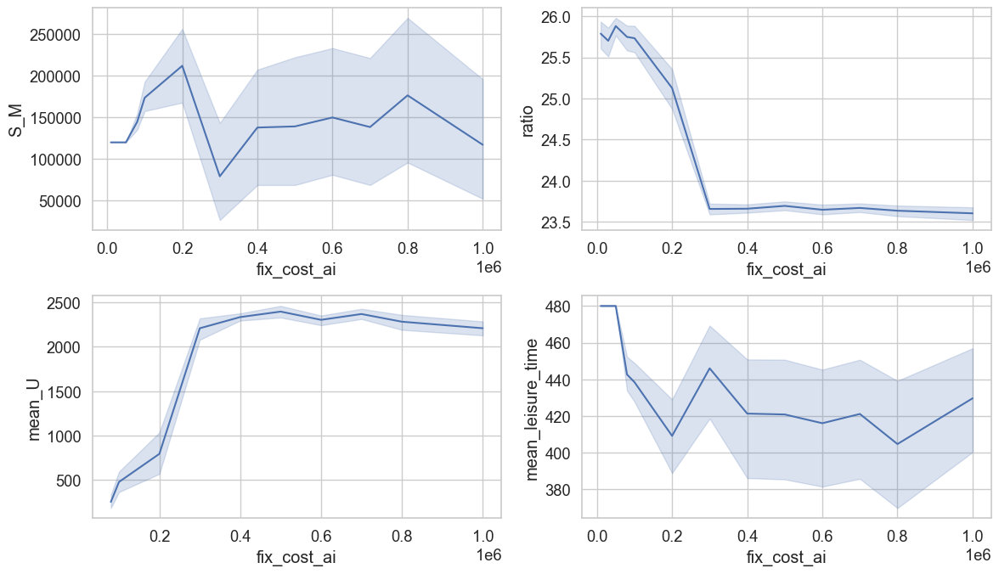

In [11]:
sns.set_theme(style='whitegrid', font_scale=1.2)

fig, axes=plt.subplots(nrows=2, ncols=2, figsize=(12,7), sharey=False, sharex=False,tight_layout=True)

for col, ax in zip(currencies, axes.flat):
    sns.lineplot(data=final_srf, x='fix_cost_ai', y=col, ax=ax)

## AI variable cost and tax rate



In [54]:
params = {'fix_ai_cost_list':(100_000, 200_000,400_000), 'ai_omega_list':(1,2,3,4,5), 'ai_tax_rate_list':(0, .2,.4,.6, .8, 1),'reps':20, 't_max':250}
srf, final_srf=run_simulation(**params)

This experiment consists of 1800 simulations
consisting of 90 parameter sets.

Finished series.


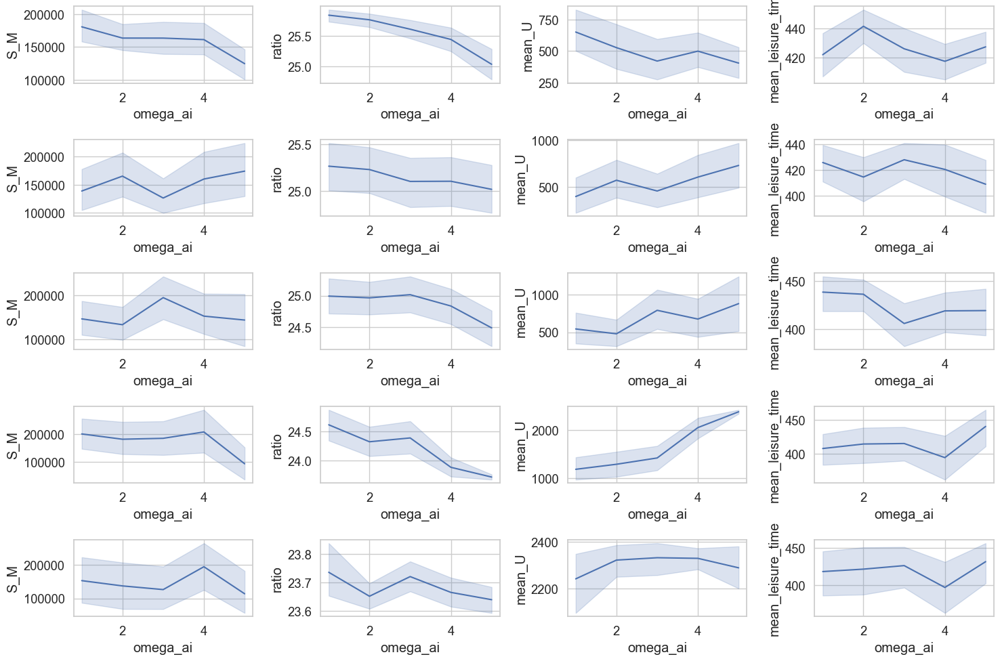

In [61]:
sns.set_theme(style='whitegrid', font_scale=1.2)

fig, axes=plt.subplots(nrows=5, ncols=4, figsize=(15,10), sharey=False, sharex=False,tight_layout=True)

for i in range(len(params['ai_tax_rate_list'])):
    tax_rate=params['ai_tax_rate_list'][i]
    for col, ax in zip(currencies, axes.flat[4*i:4*(i+1)]):
        sns.lineplot(data=final_srf.query("ai_tax_rate == @tax_rate"), x='omega_ai', y=col, ax=ax)
    
# fig, axes=plt.subplots(nrows=2, ncols=2, figsize=(12,7), sharey=False, sharex=False,tight_layout=True)
# 
# for col, ax in zip(currencies, axes.flat):
#     sns.lineplot(data=srf, x='ai_tax_rate', y=col, ax=ax)

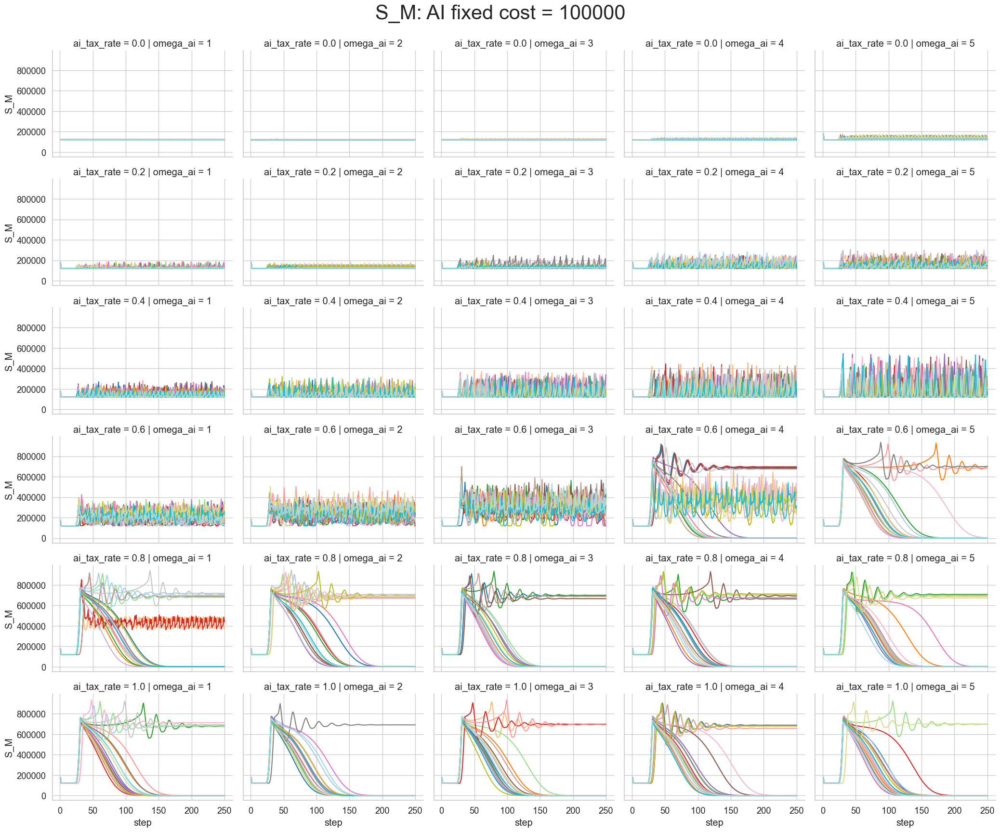

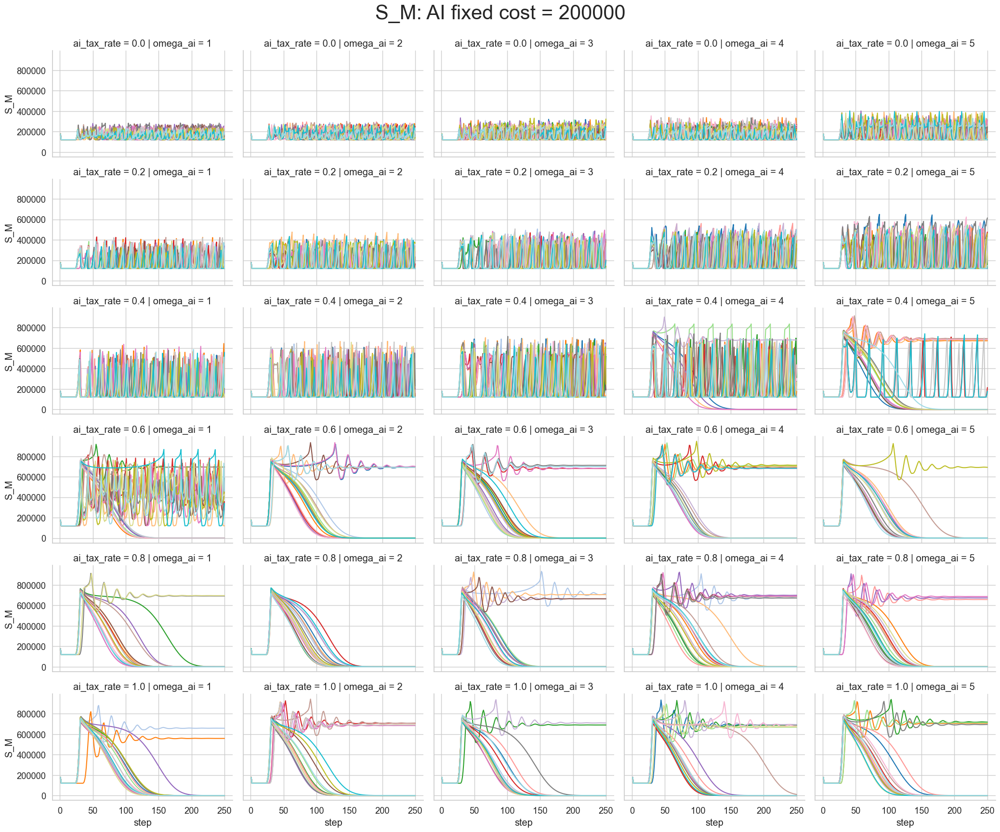

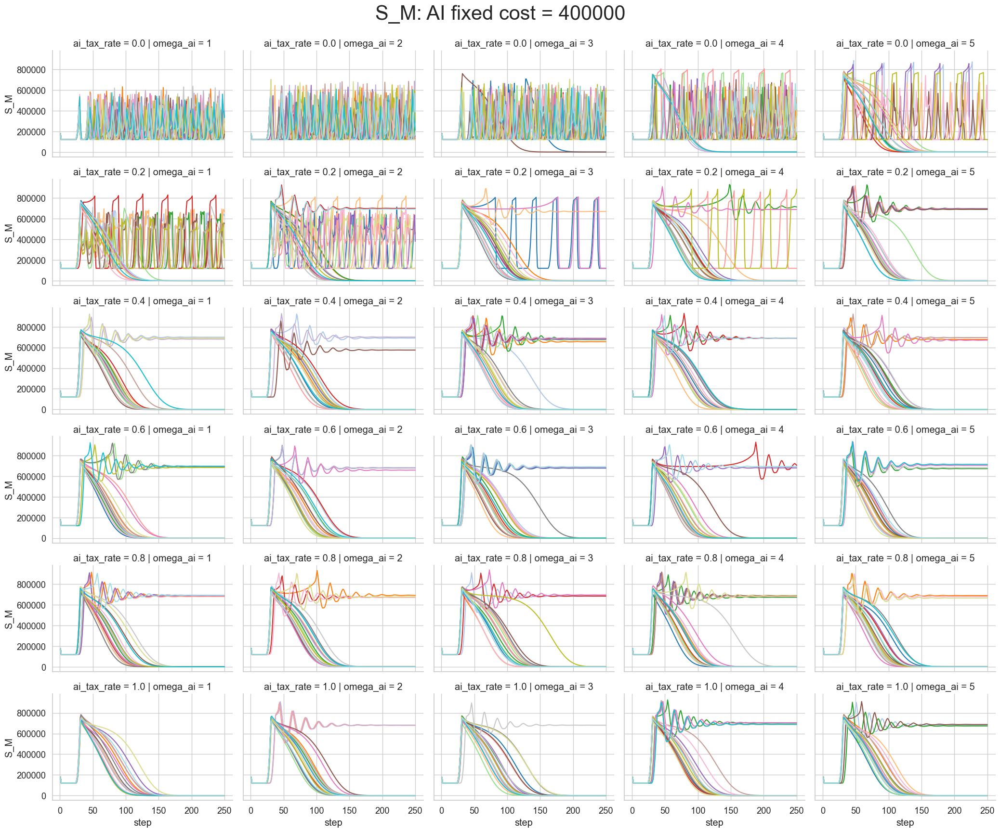

In [55]:
sns.set_theme(style='whitegrid', font_scale=1.2)

for fix_cost in params['fix_ai_cost_list']:
    sns.relplot(data=srf.query("(step > 0) & (theta == 0.1) & (fix_cost_ai == @fix_cost)"), kind='line',x='step', y='S_M', hue='run', col='omega_ai', row='ai_tax_rate',palette='tab20', facet_kws={'sharey':True},legend=False, height=2.8, aspect=1.5)
    plt.suptitle(f'S_M: AI fixed cost = {fix_cost}', y=1.03,fontsize=30)


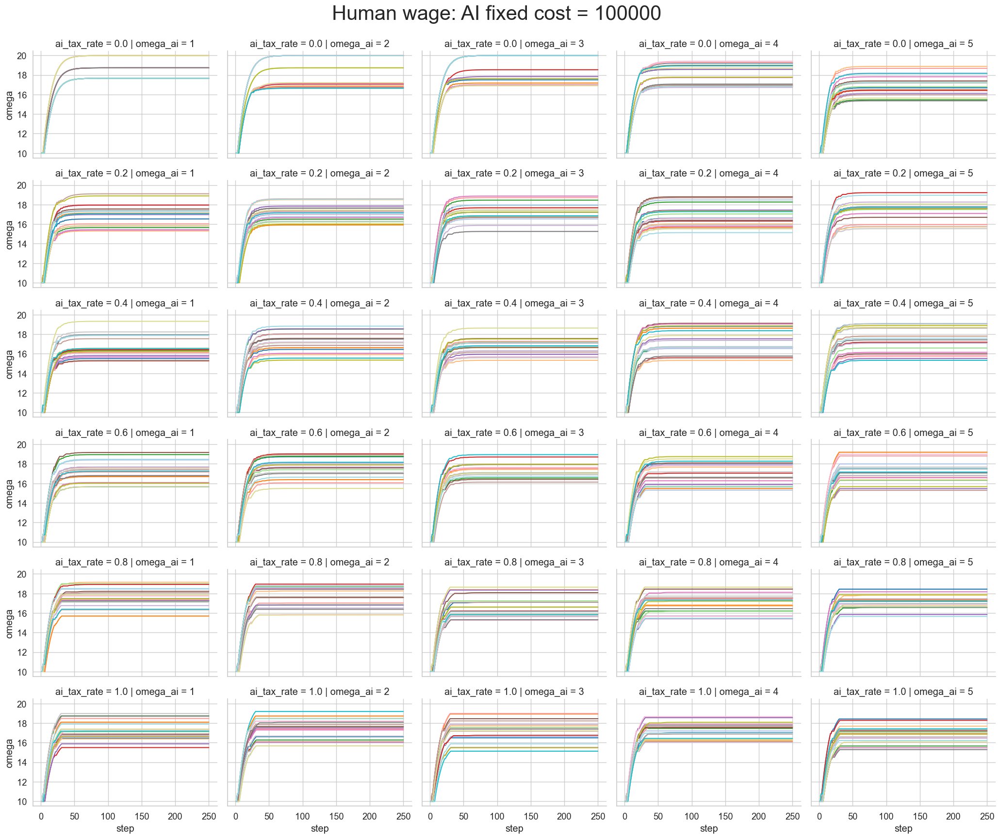

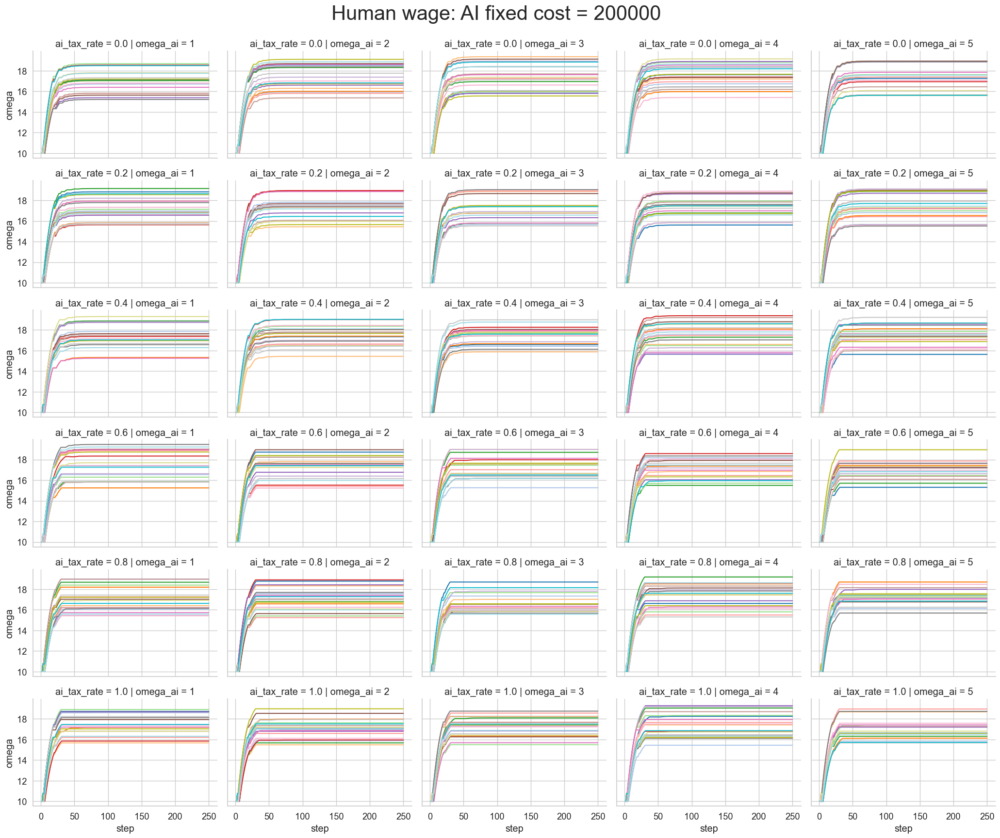

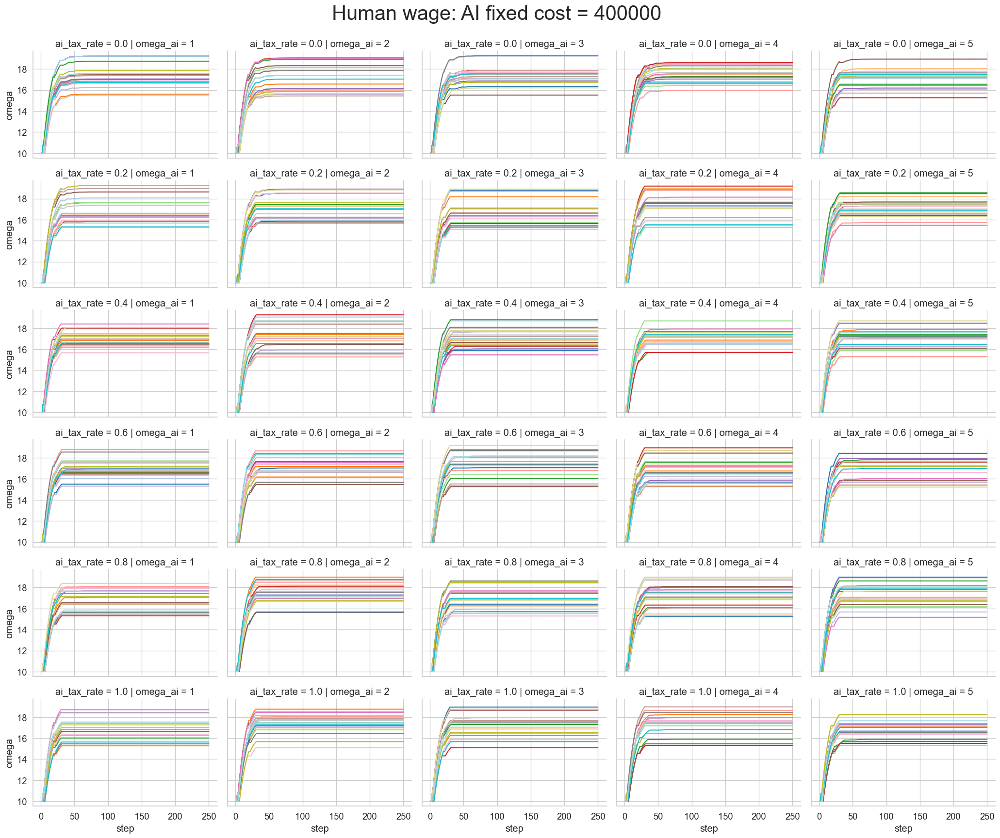

In [56]:
sns.set_theme(style='whitegrid', font_scale=1.2)

for fix_cost in params['fix_ai_cost_list']:
    sns.relplot(data=srf.query("(step > 0) & (theta == 0.1) & (fix_cost_ai == @fix_cost)"), kind='line',x='step', y='omega', hue='run', col='omega_ai', row='ai_tax_rate',palette='tab20', facet_kws={'sharey':True},legend=False, height=2.8, aspect=1.5)
    plt.suptitle(f'Human wage: AI fixed cost = {fix_cost}', y=1.03,fontsize=30)


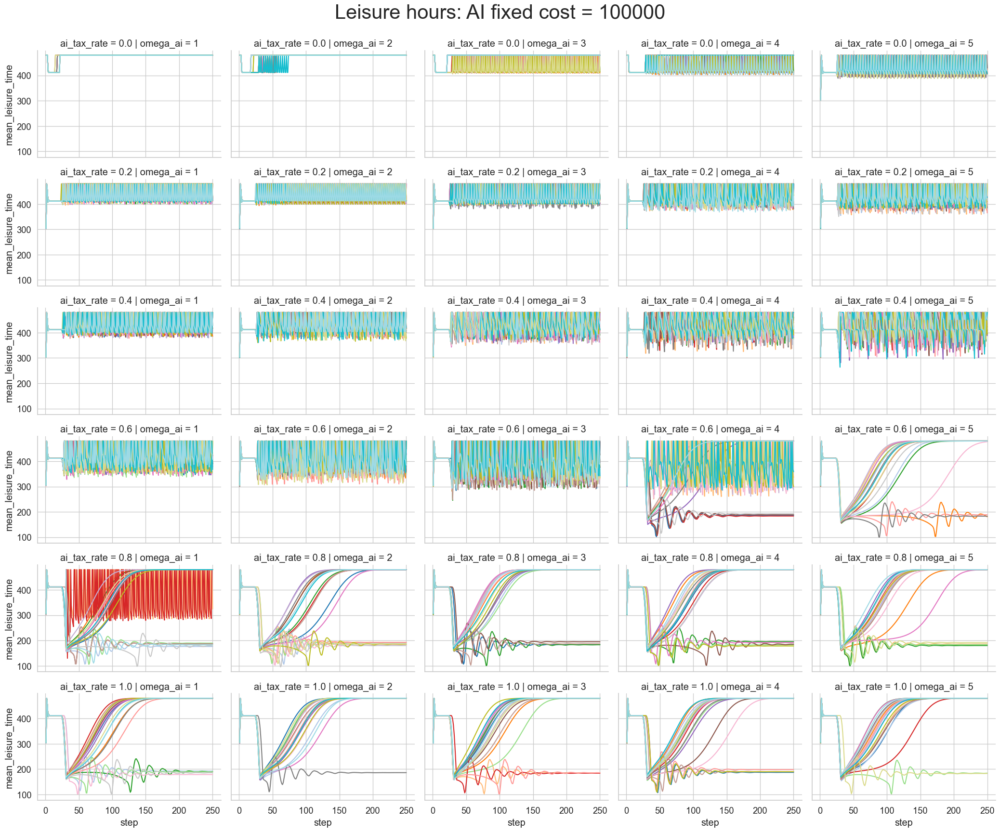

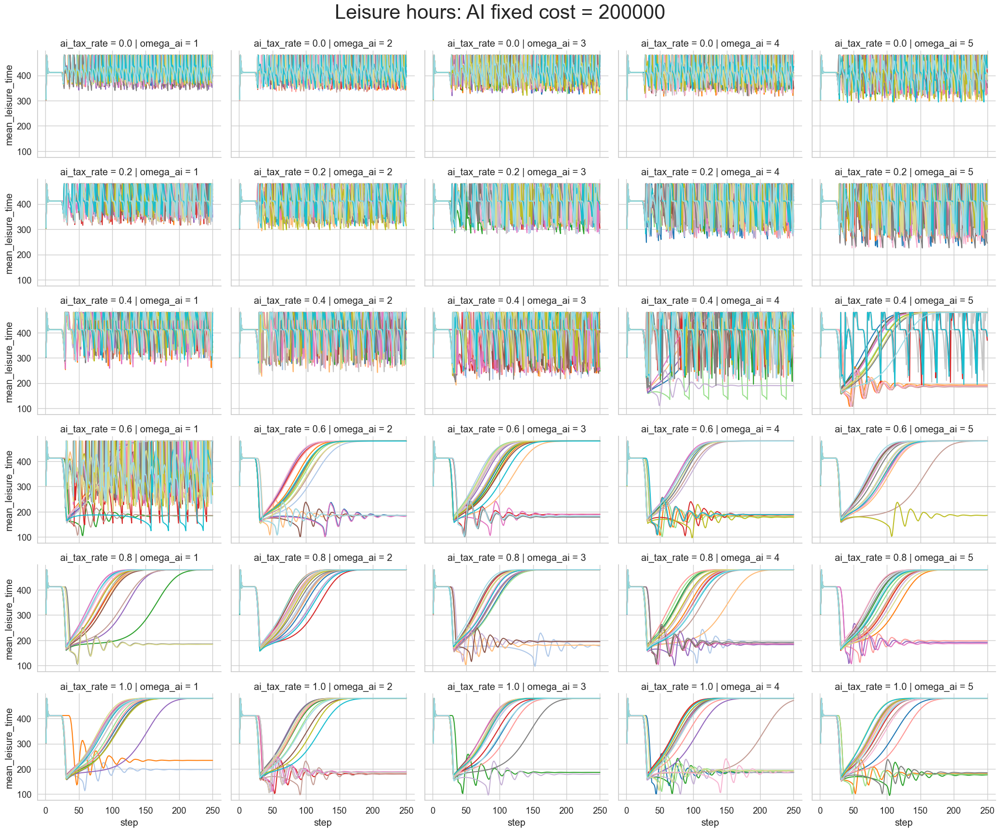

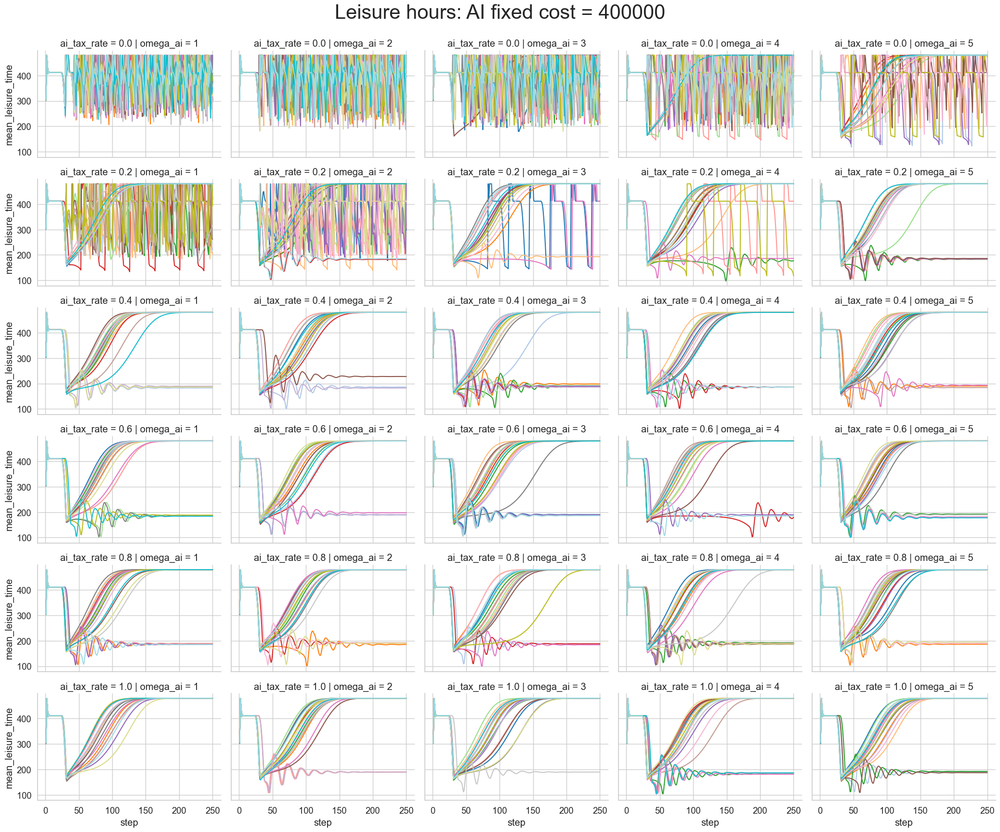

In [57]:
sns.set_theme(style='whitegrid', font_scale=1.2)

for fix_cost in params['fix_ai_cost_list']:
    sns.relplot(data=srf.query("(step > 0) & (theta == 0.1) & (fix_cost_ai == @fix_cost)"), kind='line',x='step', y='mean_leisure_time', hue='run', col='omega_ai', row='ai_tax_rate',palette='tab20', facet_kws={'sharey':True},legend=False, height=2.8, aspect=1.5)
    plt.suptitle(f'Leisure hours: AI fixed cost = {fix_cost}', y=1.03,fontsize=30)


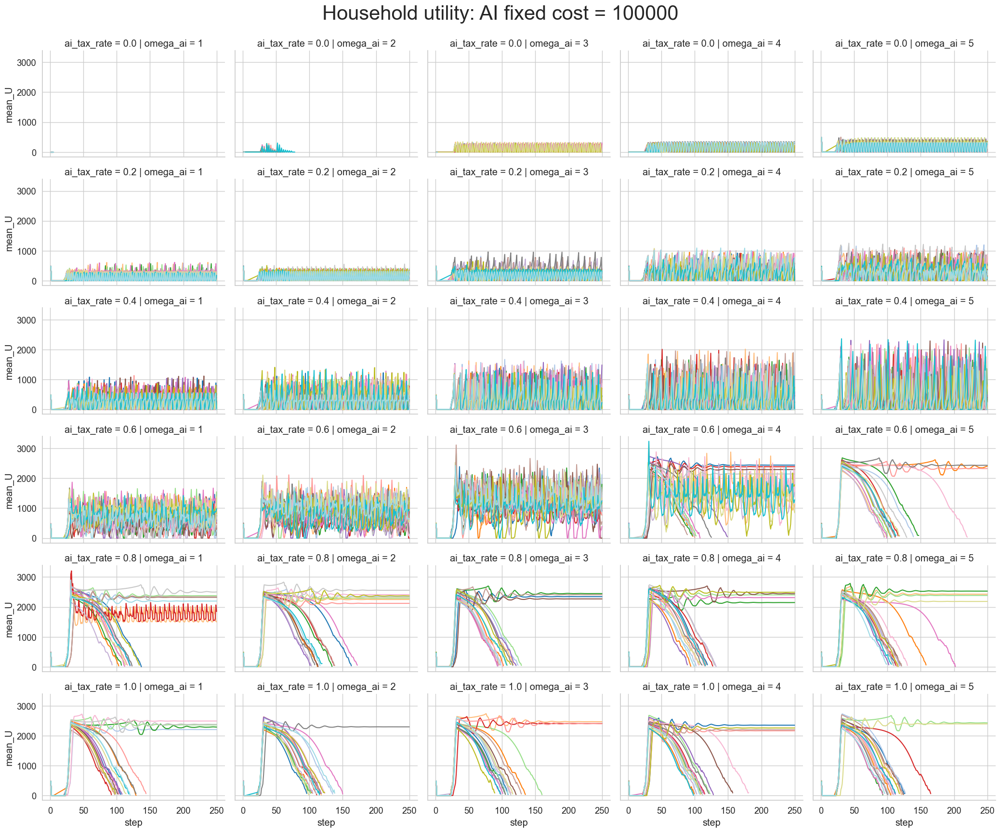

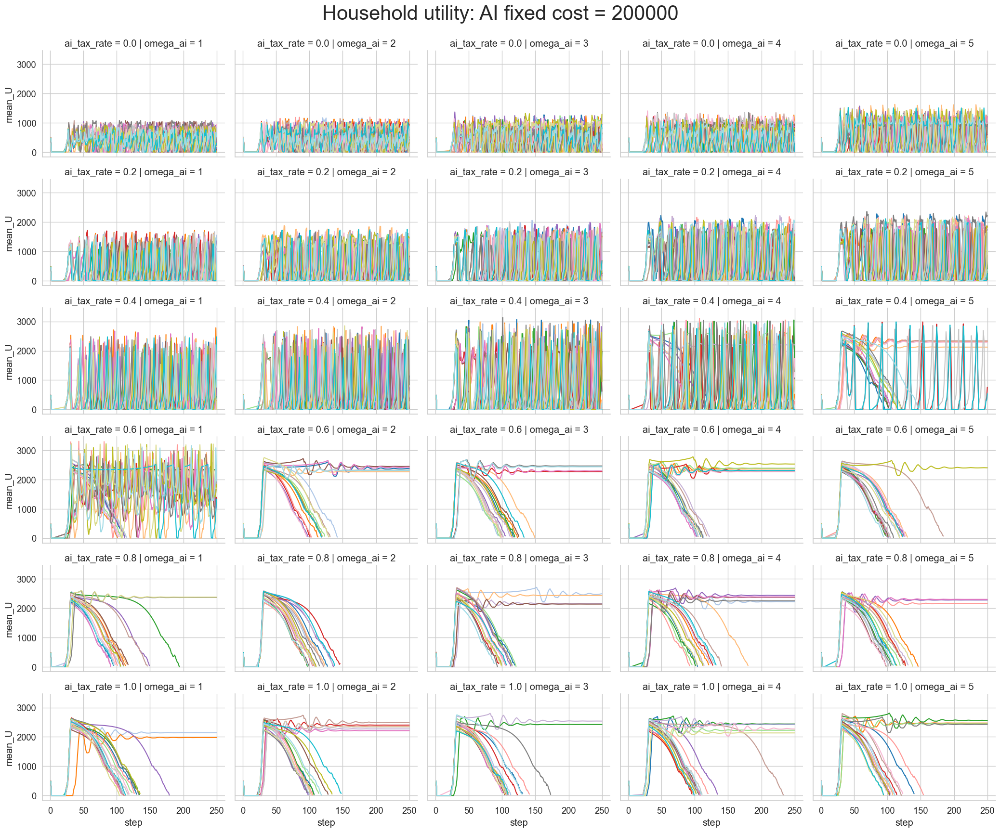

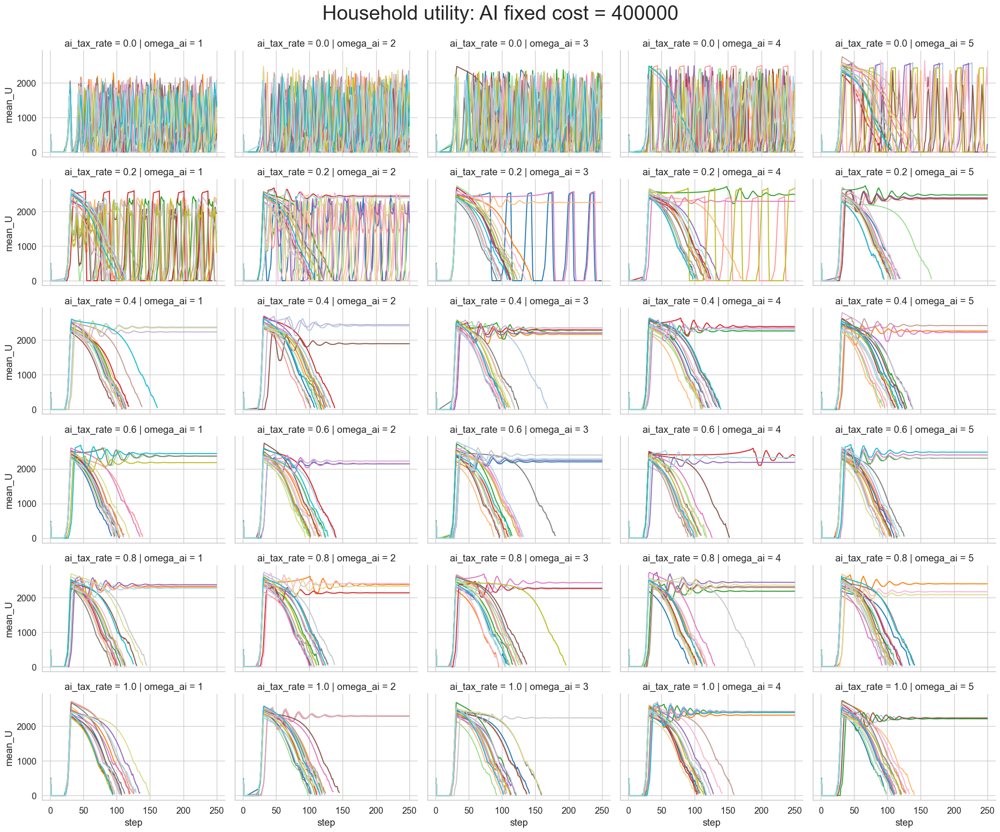

In [58]:
sns.set_theme(style='whitegrid', font_scale=1.2)

for fix_cost in params['fix_ai_cost_list']:
    sns.relplot(data=srf.query("(step > 0) & (theta == 0.1) & (fix_cost_ai == @fix_cost)"), kind='line',x='step', y='mean_U', hue='run', col='omega_ai', row='ai_tax_rate',palette='tab20', facet_kws={'sharey':True},legend=False, height=2.8, aspect=1.5)
    plt.suptitle(f'Household utility: AI fixed cost = {fix_cost}', y=1.03,fontsize=30)
